# Calibration frames

**Prerequisites**
- Basic statistics
- Knowledge about CCD, bias, dark, and flat frames.

**We will learn**
- What do bias, dark, and flat frames look like
- How to deal with outliers; sigma-clipping.
- How to combine individual calibration frames to make "master" calibration frames.
- Further familiarize with operations on numpy arrays and data I/O.

**Reference**
- [Here](https://www.astropy.org/ccd-reduction-and-photometry-guide/v/dev/notebooks/01-01-astronomical-CCD-image-components.html) is a **great** tutorial on CCD data reduction. Please check out!!
- Howell, S., Handbook of CCD Astronomy, Second Ed, Cambridge University Press 2006

In [1]:
%load_ext autoreload
%autoreload 2

import os, sys
import numpy as np
import matplotlib.pyplot as plt

# We can beautify our plots by changing the matpltlib setting a little
plt.rcParams['font.size'] = 18
plt.rcParams['figure.figsize'] = (8, 6)
plt.rcParams['figure.dpi'] = 80
plt.rcParams['axes.linewidth'] = 2

In [2]:
# Don't worry about this cell, it's just to make the notebook look a little nicer.
try:
    import google.colab
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

# Get the directory right
if IN_COLAB:
    # Download utils.py
    !wget -q -O /content/utils.py https://raw.githubusercontent.com/AstroJacobLi/ObsAstGreene/refs/heads/main/book/docs/utils.py
    # Function to check and install missing packages
    from google.colab import drive
    drive.mount('/content/drive/')
    os.chdir('/content/drive/Shareddrives/AST207/data')
else:
    # if not os.path.exists("../../../_static/ObsAstroData/"):
        # os.makedirs("../../../_static/ObsAstroData/")
    sys.path.append('../../docs/')
    os.chdir('../../_static/ObsAstroData/')

# 1. Bias frames

As discussed in class, a small voltage is applied to every pixel to ensure the pixel value is always positive. This voltage introduces a "bias" to the pixel values. However, the bias can vary slightly between pixels and may change over time. To account for this, we take zero-time exposures (where dark current and real photons do not contribute to the pixel values) to characterize the bias.

Below we load bias frames taken using the camera of IFU-M on the 6.5 m [Magellan telescope](https://en.wikipedia.org/wiki/Magellan_Telescopes) in Chile. 

## Read a bias frame

In [3]:
from astropy.io import fits

FITS (Flexible Image Transport System) format is widely used in astronomy for images and tables. The following code will read the file `b0854c1.fits`, which is a list containing only one HDU (Header Data Unit). 

In [4]:
fits.open('./calibration_frames/bias/b0860c1.fits')

```{margin}
`.info()` is quite helpful for understanding the structure of a FITS file. 
```

In [5]:
fits.open('./calibration_frames/bias/b0860c1.fits').info()

Filename: ./calibration_frames/bias/b0860c1.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     143   (2176, 1156)   int16 (rescales to uint16)   


Now we know that this file has one HDU, which is an image containing 2176 * 1156 pixels. The data type in `int16`. We can check the header of the HDU. 

In [6]:
hdu = fits.open('./calibration_frames/bias/b0860c1.fits')[0]
hdu.header

SIMPLE  =                    T                                                  
BITPIX  =                   16                                                  
NAXIS   =                    2                                                  
NAXIS1  =                 2176                                                  
NAXIS2  =                 1156                                                  
BSCALE  =           1.00000000         / real=bzero+bscale*value                
BZERO   =       32768.00000000                                                  
BUNIT   = 'DU/PIXEL'                                                            
ORIGIN  = 'LCO/OCIW'                                                            
OBSERVER= 'Bailey'                     / observer name                          
TELESCOP= 'Clay'                       / telescope                              
SITENAME= 'LCO'                                                                 
SITEALT =                 24

Let's read the data array.

In [7]:
img = hdu.data
img

array([[817, 817, 817, ..., 816, 813, 819],
       [816, 818, 820, ..., 817, 818, 828],
       [809, 827, 817, ..., 812, 814, 816],
       ...,
       [813, 810, 815, ..., 814, 816, 823],
       [821, 818, 816, ..., 823, 820, 816],
       [812, 819, 815, ..., 819, 816, 814]], dtype=uint16)

```{admonition} Exercise

Use the statistical tools that you've learned to understand this bias data. This will help you to understand the characteristics of the bias frame. 

- Where do the pixel values concentrate? How to quantify this?
- What's the dispersion of the pixel values? How to quantify this?
- Are there any outliers? How to identify them?
- What's the distribution of the pixel values? How to visualize this?
- Check the fact that there is no negative pixel value in the bias frame. Why?
```


```{tip}
The dispersion in the pixel values of a bias frame is largely contributed by the read-out noise, a noise that added to each pixel when reading the charge out. Read-out noise may be viewed as a "toll" that must be paid for reading the stored charge. Thanks to the bias voltage, none of the pixels are negative.
```

We provide a function `show_image` to help visualize astronomical images that typically have a large dynamical range. Please feel free to use it.


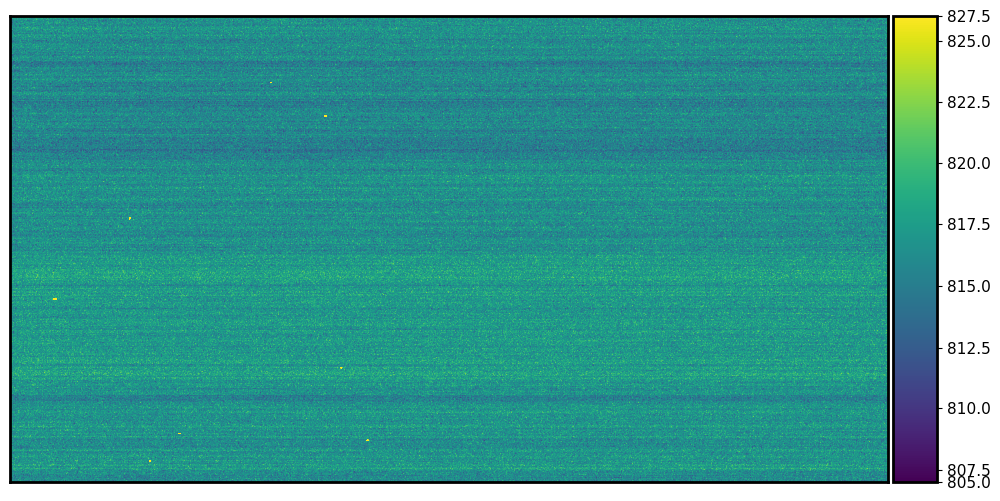

In [8]:
from utils import show_image
show_image(img, show_colorbar=True, figsize=(12, 12));

The bias frame shows some spatial patterns: some rows have a lower bias value than others. We also see some distinct "bright" pixels. They could be either bad pixels, or caused by Cosmic Rays (CR). As a consequence, when we plot the histogram of pixel values, we will see some outliers from the bulk of pixels.

<!-- ```{margin}
This figure highlights the difference between linear (left) and logarithmic (right) scales when plotting histogram. The number of outliers is too small to be visible in the left histogram with a linear scale in the y-axis. Logarithmic scale comes to save us. When you encounter a dataset that spans a huge dynamical range, maybe you should consider using `log` scale. 
``` -->

<!-- fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(12, 4))

ax1.hist(img.flatten(), bins=30)
ax1.set_xlabel('Pixel value [counts]')
ax1.set_ylabel('Frequency')
ax2.hist(img.flatten(), bins=30)
ax2.set_yscale('log')
ax2.set_xlabel('Pixel value [counts]')
ax2.set_ylabel('log Frequency')

plt.tight_layout() -->

During the Magellan observation, we took many bias frames. So let's load another bias frame. What do you expect? Will it be very different from the one above?

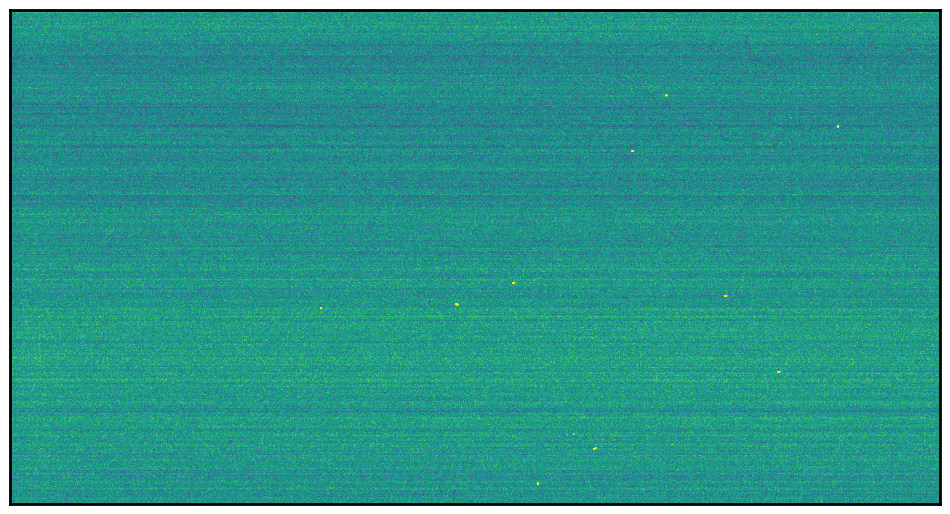

In [9]:
show_image(fits.open('./calibration_frames/bias/b0861c1.fits')[0].data);

Yeah, the bright spots changed their positions in the image. So it does seem like they are caused by cosmic rays. 

```{admonition} Exercise
What remains the same between different bias frames? What is different? How can we use this information to come up with a robust bias correction?

We have provided lots of bias frames in `./calibration_frames/bias`. You are encouraged to load them and explore the data. 
```

## Combine bias frames to make "master" bias

We have already learned from **basic statistics** that combining images will reduce the noise level. Belowe we try to combine 40 bias frames. The bias frames are all named `bXXXXc1.fits`, where `XXXX` is a four-digit number, from 0860 to 0900.

In [10]:
biases = [fits.open(f'./calibration_frames/bias/b0{ind}c1.fits')[0].data for ind in range(860, 900)]
biases = np.array(biases)

Here I use ["Nested List Comprehensions"](https://docs.python.org/3/tutorial/datastructures.html) to construct a list. This is equivalent to the following snippet, but is much shorter.
```python
biases = []
for ind in range(860, 900):
    biases.append(fits.open(
        f'./calibration_frames/bias/b0{ind}c1.fits'
        )[0].data)
```

In [11]:
biases.shape

(40, 1156, 2176)

In [12]:
# We have introduced how to calculate the mean and median image using the `axis` argument.
# Check `basic_stat.ipynb`
med_bias = np.median(biases, axis=0)
mean_bias = np.mean(biases, axis=0)

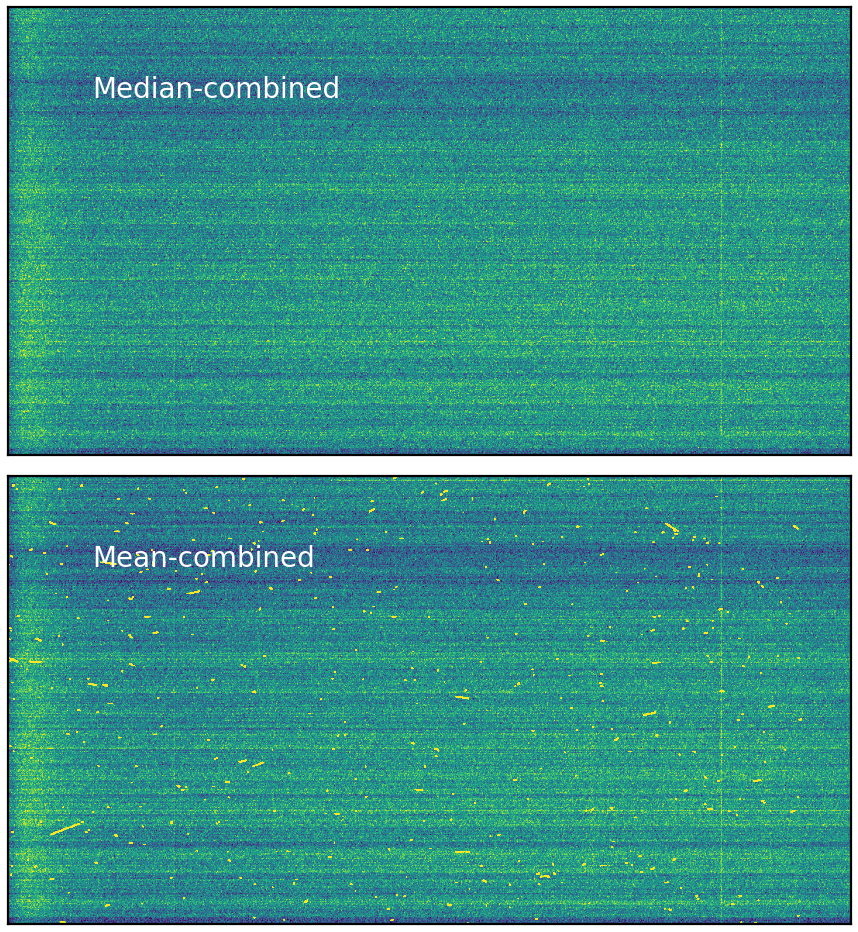

In [13]:
fig, [ax1, ax2] = plt.subplots(2, 1, figsize=(12, 12))

ax1 = show_image(med_bias, ax=ax1, fig=fig,)
ax1.text(0.1, 0.8, 'Median-combined', fontsize=25, color='w', 
         ha='left', transform=ax1.transAxes)

ax2 = show_image(mean_bias, ax=ax2, fig=fig,)
ax2.text(0.1, 0.8, 'Mean-combined', fontsize=25, color='w', 
         ha='left', transform=ax2.transAxes)

plt.tight_layout()

Wow! The cosmic rays are everywhere in the mean-combined image! The vast difference between the median-combined and mean-combined images highlights that the mean is far less immune to outliers (i.e., cosmic rays) than the median. Because of this, we often use median to combine images.

The histogram below shows again that combining individual bias frames will help reduce the read-out noise, thus boost the SNR. 

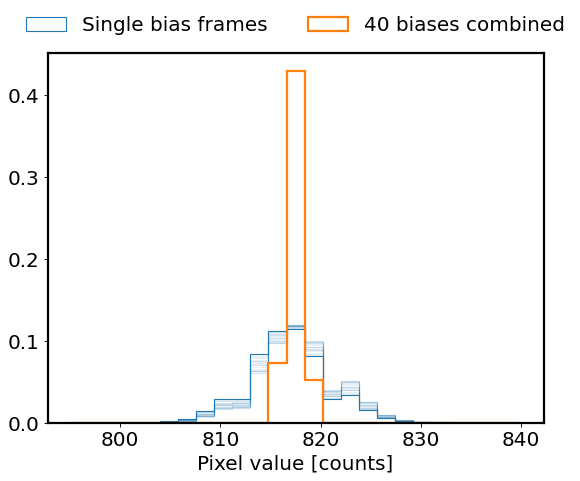

In [14]:
plt.hist(biases[0].flatten(), histtype='step', density=True, 
         range=(795, 840), bins=25, lw=1, label='Single bias frames')
for i in range(1, 21):
    plt.hist(biases[i].flatten(), histtype='step', density=True, 
         range=(795, 840), bins=25, alpha=0.1, color='C0')

plt.hist(med_bias.flatten(), histtype='step', density=True, 
         range=(795, 840), bins=25, lw=2, label='40 biases combined')

plt.xlabel('Pixel value [counts]')

plt.legend(loc='upper center', ncols=2, frameon=False, bbox_to_anchor=(0.5, 1.15));

## Sigma-clipping

In astronomy, there is yet another way to deal with outliers. 

Recall that for a Gaussian distribution, the probability for a data point being $>3\sigma$ away from the mean $\mu$ is very very slim. So if we see such a data point that is quite far from the center of the data set, it is probably an outlier and should be removed. This is the idea of **sigma clipping**. 

In the following, we flag out pixels that are $>3\sigma$ away from the median value (we don't use the mean value because it is heavily biased by these cosmic rays). You can see the cosmic rays being marked as **black** in the figure below (they are tiny dots).

In [15]:
hdu = fits.open('./calibration_frames/bias/b0860c1.fits')[0]
img = hdu.data.astype(float)
med, std = np.median(img), np.std(img)
flag = (np.abs(img - med) > 3 * std)

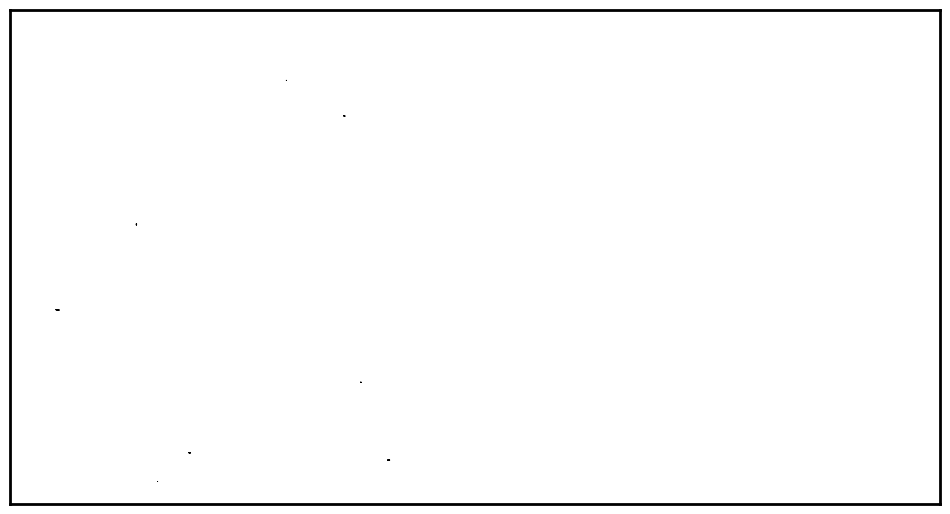

In [16]:
show_image(flag, cmap='Greys', vmin=0., vmax=0.1, show_colorbar=False);

We can replace these outlier pixels with `np.nan` (not a number, typically used to indicate a bad value). Then we repeat this for all 40 bias frames and combine them. 

In [17]:
# This might be slow
biases_clipped = []
for ind in range(860, 900):
    img = fits.open(f'./calibration_frames/bias/b0{ind}c1.fits')[0].data.astype(float)
    med, std = np.median(img), np.std(img)
    flag = (np.abs(img - med) > 3 * std)
    img[flag] = np.nan
    biases_clipped.append(img)
biases_clipped = np.array(biases_clipped)

In [18]:
# might be slow
med_bias_clipped = np.nanmedian(biases_clipped, axis=0)
mean_bias_clipped = np.nanmean(biases_clipped, axis=0)

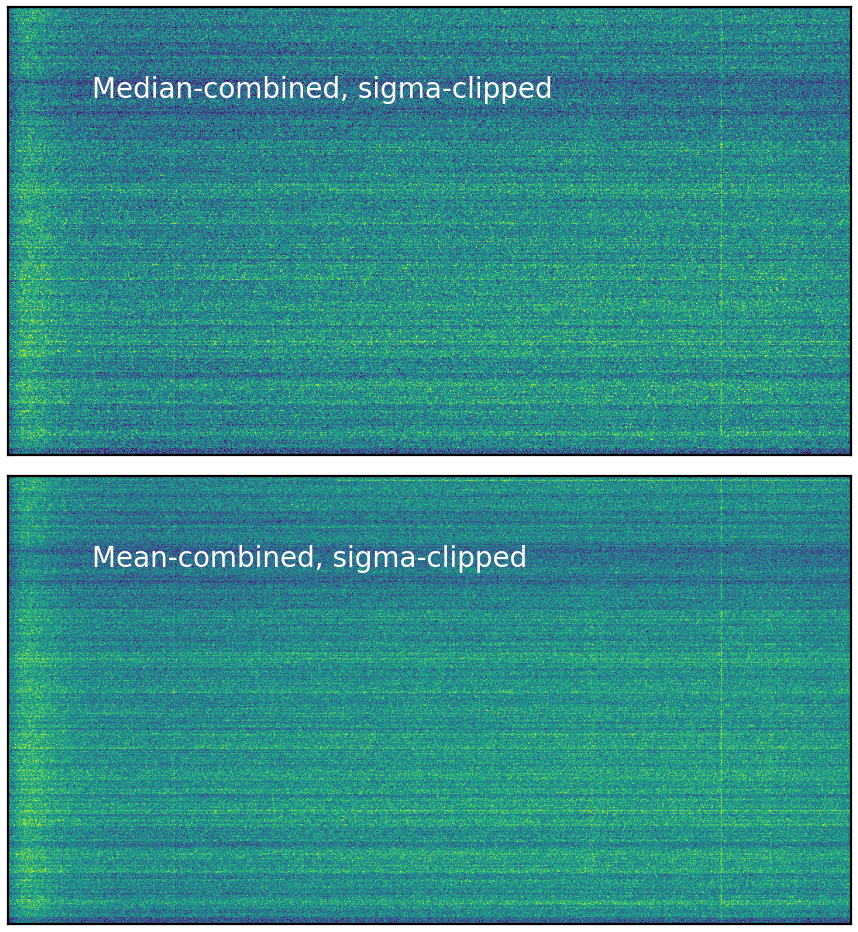

In [19]:
fig, [ax1, ax2] = plt.subplots(2, 1, figsize=(12, 12))

ax1 = show_image(med_bias_clipped, ax=ax1, fig=fig, vmin=816.6, vmax=818.4)
ax1.text(0.1, 0.8, 'Median-combined, sigma-clipped', fontsize=25, color='w', 
         ha='left', transform=ax1.transAxes)

ax2 = show_image(mean_bias_clipped, ax=ax2, fig=fig, vmin=816.6, vmax=818.4)
ax2.text(0.1, 0.8, 'Mean-combined, sigma-clipped', fontsize=25, color='w', 
         ha='left', transform=ax2.transAxes)

plt.tight_layout()

Yeah! After sigma-clipping, the mean-combined image looks much better and very similar to the median-combined one. This sigma-clipping trick is quite common in astronomy. We used a threshold of 3-sigma and only clipped once. You can repeat the procedure for several times to make sure all outliers are flagged. Actually, `astropy` already provides us a function `sigma_clip` to do these jobs. Let's check it out.

In [20]:
from astropy.stats import sigma_clip

In [21]:
astropy_clipped = sigma_clip(biases,  # the bias frames before sigma-clipping
                             sigma=3,  # threshould is 3-sigma
                             maxiters=5,  # do clipping for 5 times at most
                             cenfunc='median', stdfunc='std',
                             # use median and standard deviation to calculate clipping criterion
                             axis=(1, 2), # calc median and std for each bias frame
                             masked=False)

In [22]:
# might be slow
med_bias_apy = np.nanmedian(astropy_clipped, axis=0)
mean_bias_apy = np.nanmean(astropy_clipped, axis=0)

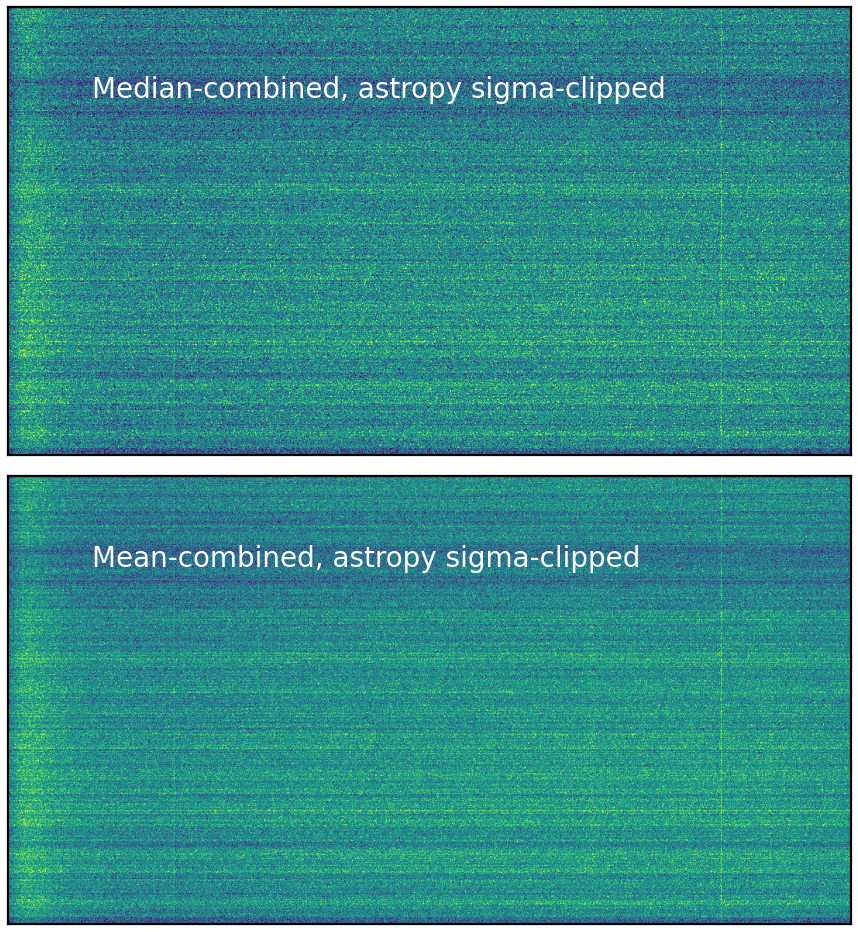

In [23]:
fig, [ax1, ax2] = plt.subplots(2, 1, figsize=(12, 12))

ax1 = show_image(med_bias_apy, ax=ax1, fig=fig, vmin=816.6, vmax=818.4)
ax1.text(0.1, 0.8, 'Median-combined, astropy sigma-clipped', fontsize=25, color='w', 
         ha='left', transform=ax1.transAxes)

ax2 = show_image(mean_bias_apy, ax=ax2, fig=fig, vmin=816.6, vmax=818.4)
ax2.text(0.1, 0.8, 'Mean-combined, astropy sigma-clipped', fontsize=25, color='w', 
         ha='left', transform=ax2.transAxes)

plt.tight_layout()

We can write the median-combined image to a FITS file for future usage. 

In [24]:
hdu = fits.PrimaryHDU(med_bias_clipped.astype(np.float32))
hdulist = fits.HDUList([hdu])
hdulist.writeto('./calibration_frames/bias/master_bias.fits', overwrite=True)

# 2. Dark frames

Just to give you a flavor of dark frame, here we show the five dark frames that we took during the Magellan observation. They are full of cosmic rays. We construct a master dark frame by combining them using median.

In [25]:
darks = [fits.open(f'./calibration_frames/dark/b{ind}c1.fits')[0].data for ind in range(1212, 1217)]
darks = np.array(darks)
med_dark = np.median(darks, axis=0)

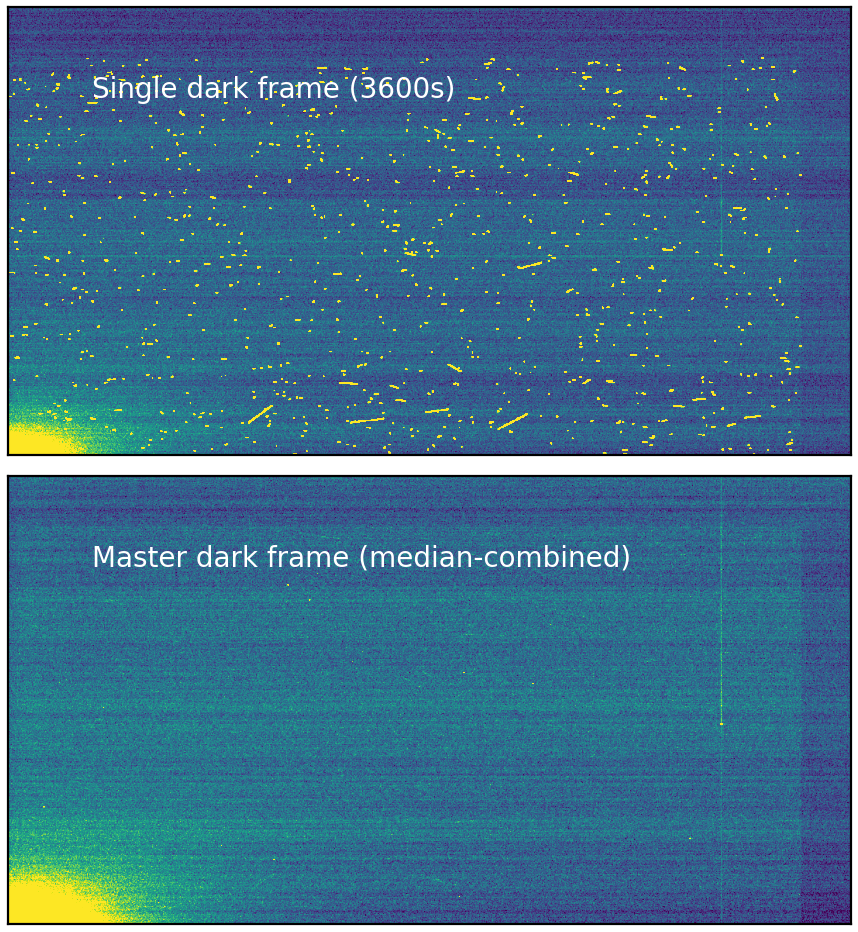

In [26]:
fig, [ax1, ax2] = plt.subplots(2, 1, figsize=(12, 12))

ax1 = show_image(darks[0], ax=ax1, fig=fig)
ax1.text(0.1, 0.8, 'Single dark frame (3600s)', fontsize=25, color='w', 
         ha='left', transform=ax1.transAxes)

ax2 = show_image(med_dark, ax=ax2, fig=fig)
ax2.text(0.1, 0.8, 'Master dark frame (median-combined)', fontsize=25, color='w', 
         ha='left', transform=ax2.transAxes)

plt.tight_layout()

The light area in the lower left corner is due to sensor glow, which is light emitted by the electronics of the CCD. The counts in a dark frame scales linearly with time. The exposure time for a dark frame is typically similar to (or longer than) the exposure time of your science frames. 

# 3. Flat frames

Flat frames are used to correct for pixel-to-pixel sensitivity variations due to dust on the optics, vignetting, CCD quantum efficiency, etc. They are taken by pointing the telescope at a uniformly illuminated screen. The screen can be a white screen, a twilight sky, or a dome screen. Below, we load the flat frames taken during the Magellan observation.

Let's load a few flat frames of the Magellan [IMACS camera](https://www.lco.cl/?epkb_post_type_1=imacs-user-manual) and see how they look like. These data are taken with for the `i` filter using the "screen" in the dome (so-called "dome flat").

In [28]:
camera = 'ift'
detector = 'c2'
flats = [fits.open(f'./calibration_frames/flat/{camera}/{camera}{ind:04d}{detector}.fits')[0].data.T for ind in range(14, 19)]
flats = np.array(flats)[:, :1024, :2048] # we trim off the overscan region
med_flat = np.median(flats, axis=0)

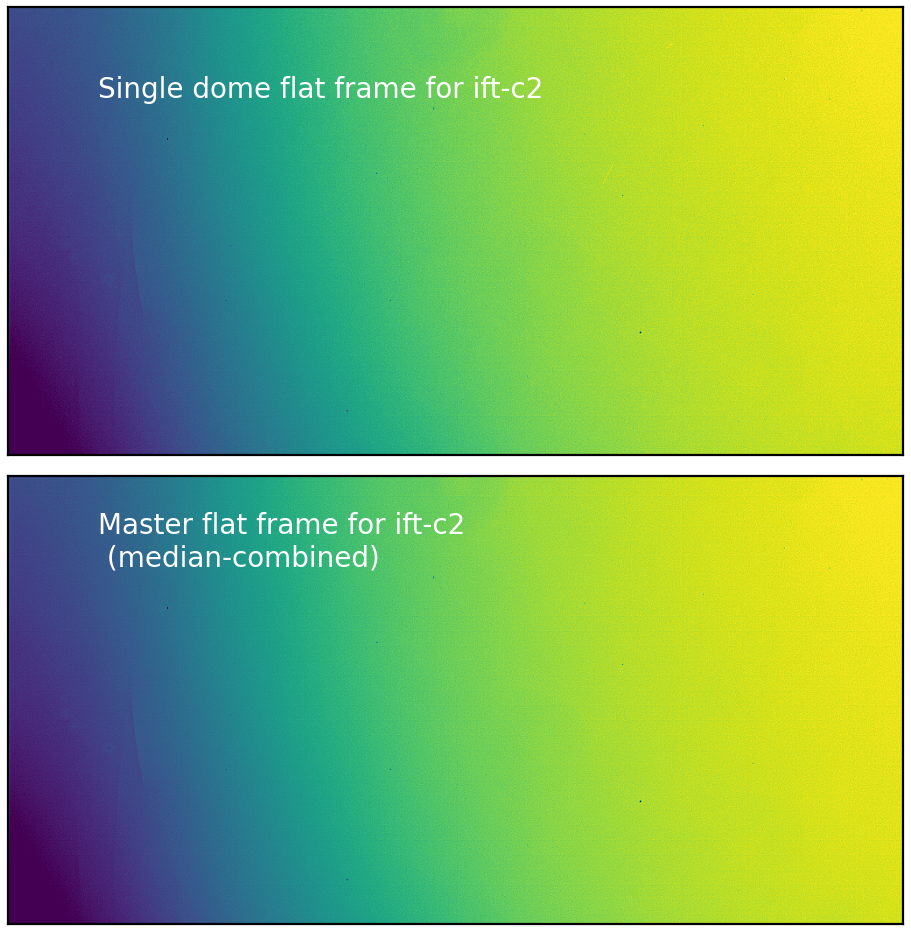

In [29]:
fig, [ax1, ax2] = plt.subplots(2, 1, figsize=(12, 12))

ax1 = show_image(flats[0], ax=ax1, fig=fig)
ax1.text(0.1, 0.8, f'Single dome flat frame for {camera}-{detector}', fontsize=25, color='w', 
         ha='left', transform=ax1.transAxes)

ax2 = show_image(med_flat, ax=ax2, fig=fig)
ax2.text(0.1, 0.8, f'Master flat frame for {camera}-{detector} \n (median-combined)', fontsize=25, color='w', 
         ha='left', transform=ax2.transAxes)
plt.tight_layout()

For the above figure, we see that the flat frames are not flat at all! The vignetting effect (i.e., the illumination is not uniform across the field)  is quite obvious. The absolute value of the pixels in the flat frame is not important, but the relative value is. So we normalize the flat frames by dividing them by their median value. 

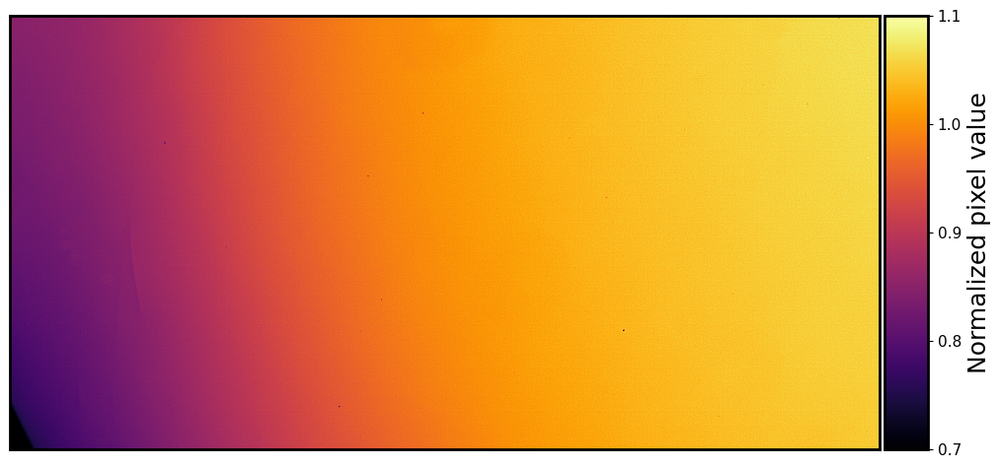

In [31]:
med_flat_norm = med_flat / np.nanmedian(med_flat)
show_image(med_flat_norm, vmin=0.7, vmax=1.1, cmap='inferno', 
           show_colorbar=True, figsize=(12, 6), colorbar_label='Normalized pixel value');

Note that the above flat frame is only 1/8 of the full field-of-view of the IMACS camera, but the illumination pattern is still quite obvious. 
Stars at the edge/corner of the field-of-view will look dimmer than those in the center, despite having the same magnitude/intrinsic brightness. In order to correct for this, we need to divide any science frame by the flat frame. 

Not all flat frames look this good! Let's see the flat frames of another camera (also on Magellan)! You'll see lots of dust spots and artifacts. 

In [32]:
camera = 'iff'
detector = 'c3'
flats = [fits.open(f'./calibration_frames/flat/{camera}/{camera}{ind:04d}{detector}.fits')[0].data.T for ind in range(8, 13)]
flats = np.array(flats)[:, :1024, :2048] # we trim off the overscan region
med_flat = np.median(flats, axis=0)

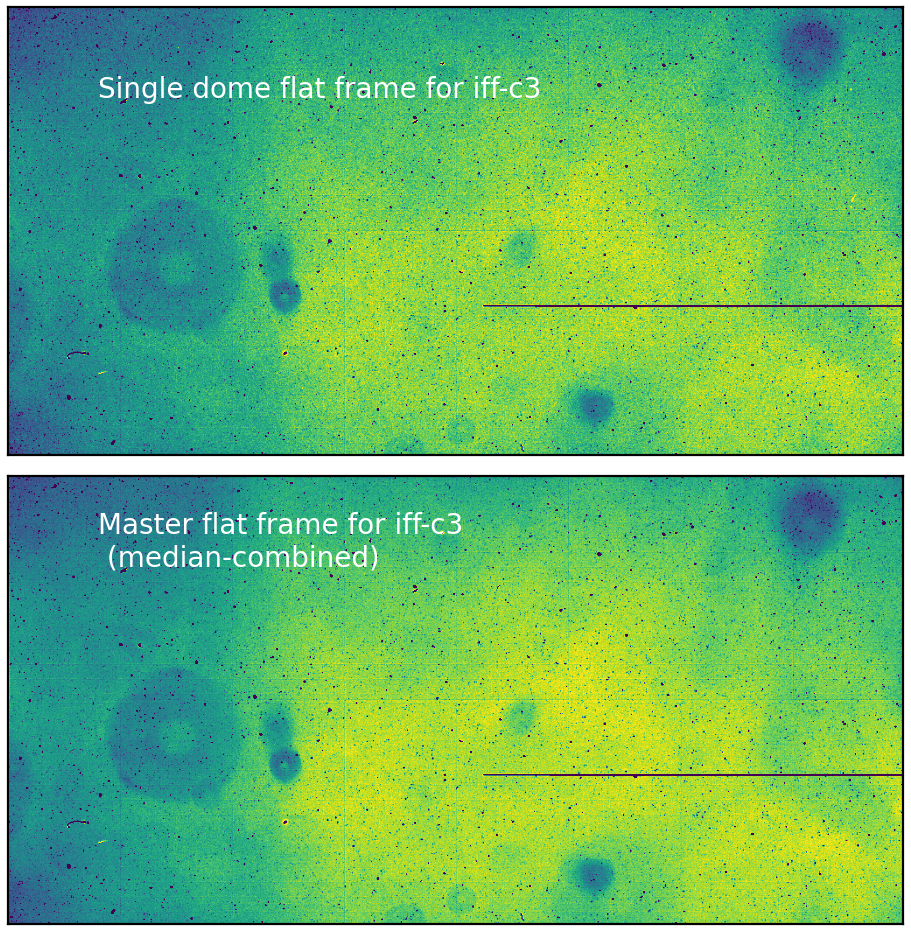

In [33]:
fig, [ax1, ax2] = plt.subplots(2, 1, figsize=(12, 12))

ax1 = show_image(flats[0], ax=ax1, fig=fig)
ax1.text(0.1, 0.8, f'Single dome flat frame for {camera}-{detector}', fontsize=25, color='w', 
         ha='left', transform=ax1.transAxes)

ax2 = show_image(med_flat, ax=ax2, fig=fig)
ax2.text(0.1, 0.8, f'Master flat frame for {camera}-{detector} \n (median-combined)', fontsize=25, color='w', 
         ha='left', transform=ax2.transAxes)
plt.tight_layout()

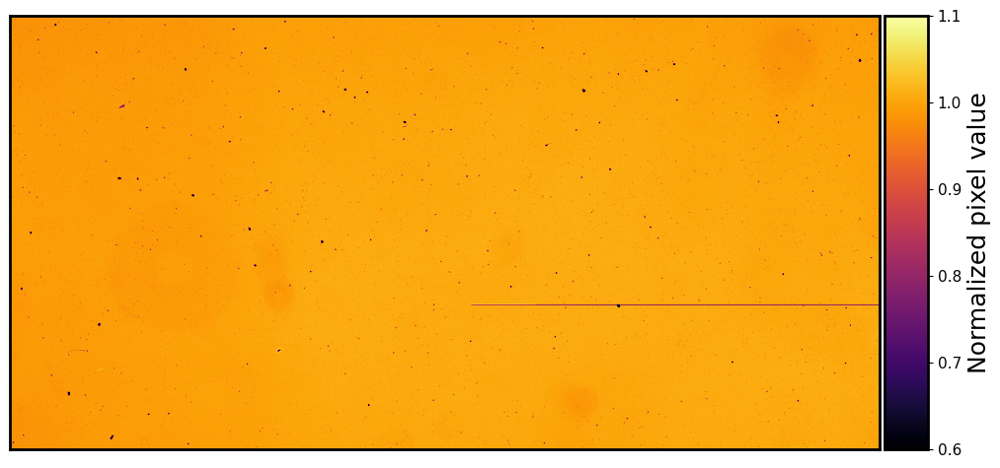

In [36]:
med_flat_norm = med_flat / np.nanmedian(med_flat)
show_image(med_flat_norm, vmin=0.6, vmax=1.1, cmap='inferno', 
           show_colorbar=True, figsize=(12, 6), colorbar_label='Normalized pixel value');

Oh my gosh... The flat frames are full of dust spots and dead pixels! The dust spots are caused by dust on the optics, while the dead pixels are pixels that are not sensitive to light (you can see their sensitivity is <0.6 from the colorbar). These dust spots and dead pixels are "fixed" in the camera and will show up in every science frame. This highlights the need of flat frames to correct the science exposures!

```{admonition} Exercise
Actually, the median flat we just made is not ready to use for flat-fielding. Do you know why? Does the flat frame also have a bias level and a dark current? How can we correct for this?
```


## Summary and Homework
We have learned how to read and understand bias, dark, and flat frames. We have also learned how to combine multiple calibration frames to make "master" calibration frames. We have also learned how to deal with outliers using sigma-clipping. 

```{admonition} Homework
- Does a dark frame also have a bias level? If so, how can we correct for this?
- Load all dark frames in `./calibration_frames/dark`, subtract the master bias frame from each dark frame, and then combine them to make a master dark frame. Try different combining methods (mean, median, sigma-clipping) and compare the results.
```